In [1]:
import matplotlib.pyplot as plt
from gerrychain import (GeographicPartition, Partition, Graph, 
                       MarkovChain, proposals, updaters, constraints,
                       accept, Election)
from gerrychain.proposals import propose_chunk_flip
from functools import partial
import pandas as pd
import geopandas as gpd

In [2]:
oakland_blocks = gpd.read_file(
    'data/block_2010_data/nhgis0005_shape/nhgis0005_shapefile_tl2010_060_block_2010/CA_block_2010.shp').set_index('GEOID10')
oakland_blocks.head()

,STATEFP10,COUNTYFP10,TRACTCE10,BLOCKCE10,NAME10,MTFCC10,UR10,UACE10,UATYP10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,GISJOIN,Shape_area,Shape_len,geometry
GEOID10,,,,,,,,,,,,,,,,,,
060839801001030,06,083,980100,1030,Block 1030,G5040,R,None,None,S,167769,0,+34.0591019,-120.3358673,G06008309801001030,1.677695e+05,3353.624565,"MULTIPOLYGON (((-2206015.932 -101657.724, -220..."
060839801001047,06,083,980100,1047,Block 1047,G5040,R,None,None,S,132853658,1257,+33.9746147,-120.1477892,G06008309801001047,1.329158e+08,74313.354262,"POLYGON ((-2181405.165 -113455.943, -2181407.1..."
060839801001029,06,083,980100,1029,Block 1029,G5040,R,None,None,S,12286,0,+34.0406847,-120.4588267,G06008309801001029,1.228553e+04,541.743249,"POLYGON ((-2216942.218 -100327.983, -2216930.8..."
060839801001056,06,083,980100,1056,Block 1056,G5040,R,None,None,S,4986,0,+34.0280957,-120.4437615,G06008309801001056,4.985548e+03,349.108823,"MULTIPOLYGON (((-2215789.478 -102240.909, -221..."
060839801001021,06,083,980100,1021,Block 1021,G5040,R,None,None,S,455,0,+34.0291854,-120.4598499,G06008309801001021,4.548543e+02,87.909874,"POLYGON ((-2217294.630 -101627.956, -2217296.2..."


In [3]:
oakland_rl_cw = pd.read_csv('data/outputs/Oakland_blocks_2010_crosswalk.csv', dtype={'block_id_2010': str}).set_index('block_id_2010')
oakland_blocks = oakland_blocks.join(oakland_rl_cw, how='outer').dropna()

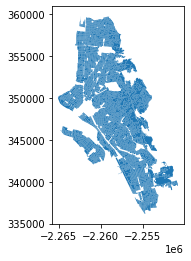

In [4]:
oakland_blocks.plot()

In [5]:
graph = Graph.from_geodataframe(dataframe=oakland_blocks, adjacency='queen')

/home/arunavgupta/anaconda3/envs/segregation-measure/lib/python3.8/site-packages/gerrychain/graph/graph.py:227: UserWarning: Found islands (degree-0 nodes). Indices of islands: {'060014044001013', '060014323003028', '060014080002012', '060014080002013', '060014035011006', '060014287002087'}
  warnings.warn(


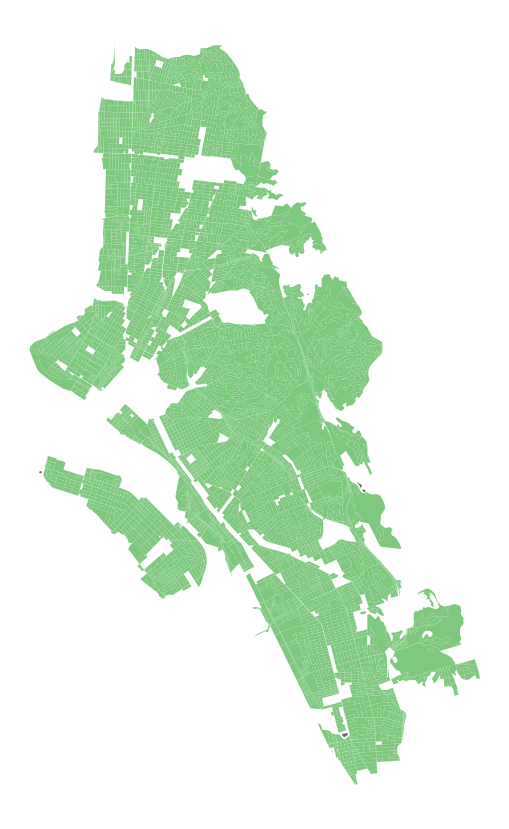

In [6]:
is_an_island = oakland_blocks.index.isin(graph.islands)
oakland_blocks.plot(column=is_an_island, figsize=(15,15), cmap='Accent')
plt.axis('off')
plt.show()

In [6]:
partition = Partition(graph, assignment=oakland_rl_cw.to_dict()['holc_id_uq'])

(-2265831.78042166, -2250056.1315277284, 334977.8153046182, 360956.8320138614)

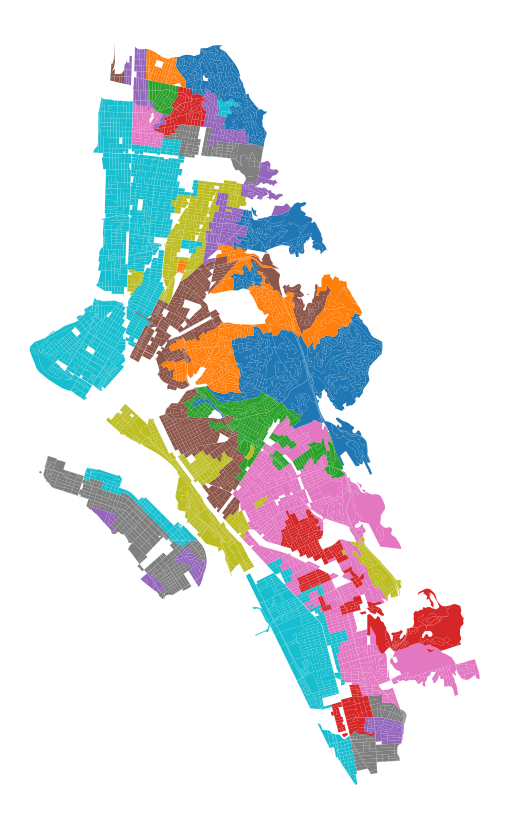

In [14]:
partition.plot(figsize=(15,15))
plt.axis('off')

In [15]:
proposal = spectral_recom(partition)

NameError: name 'spectral_recom' is not defined

In [16]:
chain = MarkovChain(proposal=propose_chunk_flip, 
                    constraints=lambda x: True,
                   accept=accept.always_accept,
                   initial_state=partition,
                   total_steps=10000)

In [17]:
from tqdm import tqdm

count = 0
for step in chain.with_progress_bar():
    # save every 100th map as image
    if count % 100 == 0:
        step.plot(figsize=(20,20))
        plt.axis('off')
        plt.savefig(f"oakland_chunk_flip/{count}.png")
        plt.close()
    count += 1

0%|          | 0/10000 [00:01<?, ?it/s]


FileNotFoundError: [Errno 2] No such file or directory: 'oakland_chunk_flip/0.png'

In [29]:
g = next(chain)
type(g)

gerrychain.partition.partition.Partition

In [28]:
dict(g.assignment)
dup = oakland_blocks.copy()
dup['new_part'] = dup.index.map(dict(g.assignment))
dup

,STATEFP10,COUNTYFP10,TRACTCE10,BLOCKCE10,NAME10,MTFCC10,UR10,UACE10,UATYP10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,GISJOIN,Shape_area,Shape_len,geometry,holc_id_uq,new_part
060014001001008,06,001,400100,1008,Block 1008,G5040,U,78904,U,S,22169,0,+37.8626339,-122.2431960,G06000104001001008,22169.742473,860.604479,"POLYGON ((-2257883.844 354445.744, -2257889.38...",A6,A6
060014001001009,06,001,400100,1009,Block 1009,G5040,U,78904,U,S,163944,0,+37.8743607,-122.2426018,G06000104001001009,163943.914780,1843.764848,"POLYGON ((-2257523.072 355843.479, -2257526.11...",B55,B55
060014001001011,06,001,400100,1011,Block 1011,G5040,U,78904,U,S,9201,0,+37.8615695,-122.2438887,G06000104001001011,9200.923862,536.797316,"POLYGON ((-2258037.111 354431.630, -2258027.77...",A6,A6
060014001001012,06,001,400100,1012,Block 1012,G5040,U,78904,U,S,106136,0,+37.8718914,-122.2422044,G06000104001001012,106136.194450,1986.292174,"POLYGON ((-2257551.738 355453.427, -2257514.15...",B55,B55
060014001001013,06,001,400100,1013,Block 1013,G5040,U,78904,U,S,86073,0,+37.8687767,-122.2382948,G06000104001001013,86073.095398,2068.728684,"POLYGON ((-2257468.947 354802.421, -2257469.38...",B55,B55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
060019832001048,06,001,983200,1048,Block 1048,G5040,U,78904,U,S,888,0,+37.7950945,-122.2717453,G06000109832001048,887.842748,246.955118,"POLYGON ((-2262380.061 347767.326, -2262380.64...",D101,D101
060019832001049,06,001,983200,1049,Block 1049,G5040,U,78904,U,S,9558,0,+37.7954696,-122.2715536,G06000109832001049,9557.544581,396.820835,"POLYGON ((-2262399.134 347894.715, -2262385.63...",D101,D101
060019832001050,06,001,983200,1050,Block 1050,G5040,U,78904,U,S,8323,0,+37.7961060,-122.2710634,G06000109832001050,8323.003950,369.041425,"POLYGON ((-2262270.716 347889.737, -2262284.11...",D101,D101
060019832001053,06,001,983200,1053,Block 1053,G5040,U,78904,U,S,9497,0,+37.7947453,-122.2720003,G06000109832001053,9497.063503,395.370208,"POLYGON ((-2262385.871 347760.587, -2262394.65...",D101,D101
